# **Introduction**

The goal of this notebook is to provide the reader with an overview of the data. Some aspects of the data that will be dealt with for this project are highlighted. This includes exploration of temporal data, geographical data, categorical data. It is done through visual representation of data in the form of bar plots, pivot table, aggregation and map representation.

Some EDA was also performed in the previous notebooks (Cleaning and Augmentation). This notebook is a complement. Section 1.1 to 1.5 are dedicated to the independent features. In section 1.6, the focus is on the dependent variable.

# **0. Imports and setup**

Hereafter the augmented data set is loaded.

In [0]:
#Imports
import pandas as pd
df = pd.read_csv("https://drive.switch.ch/index.php/s/Gs1wqzxkNeCppeC/download")

In [220]:
df.sample(3)

,Inspection ID,DBA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Year,Month,Weekday,LenViol,TMAX,MeanMaxTemp3Days,ApproxCreationDate,DaysInBusiness
97640,1198331,BOW TRUSS,2158512,restaurant,Risk 2 (Medium),2934 N BROADWAY,60657,2012-06-21,license,Pass,"35. WALLS, CEILINGS, ATTACHED EQUIPMENT CONSTR...",41.935930,-87.644407,2012,6,3,399,28.3,33.866667,2012-06-13,8.0
76930,1343417,ACE ICRE WOOD STREET,2120226,restaurant,Risk 1 (High),1151 S WOOD ST,60612,2013-08-19,canvass,Pass,31. CLEAN MULTI-USE UTENSILS AND SINGLE SERVIC...,41.866959,-87.671207,2013,8,0,889,30.0,27.033333,2011-09-22,697.0
20630,1752118,KANELA,2458615,restaurant,Risk 1 (High),5413 N CLARK ST,60640,2016-04-18,license,Pass,"35. WALLS, CEILINGS, ATTACHED EQUIPMENT CONSTR...",41.980205,-87.668159,2016,4,0,384,28.3,24.100000,2016-04-11,7.0


In [221]:
df.shape

(122595, 21)

The dimensionality is 21, while the cardinality is 122'595.

# **1. EDA**

The goal of this section is to provide insights on the data. 

### **1.1 Temporal data**

#### **1.1.1 Number of inspections per month**

In [0]:
# Date conversion
df["Inspection Date"] =  pd.to_datetime(df["Inspection Date"])

The graph below shows the monthly inspections count. Over this 8.5 years period, the number of inspection per month varies between 800 and 1'600 approximately.

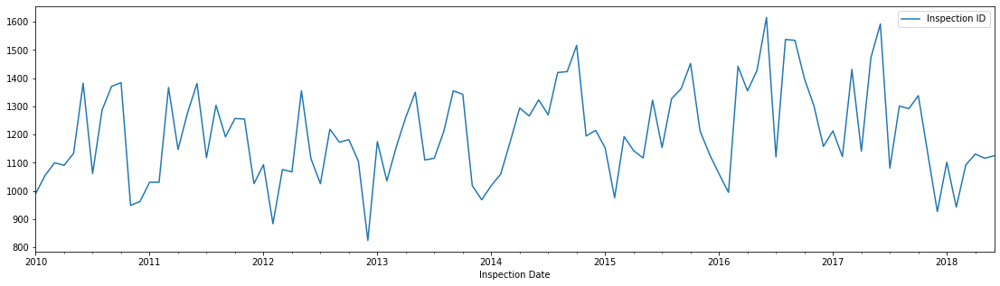

In [223]:
#Inspection date visualisation (we see an important drop in july 2018 which corresponds to the legislation changes)
pivot_date = pd.pivot_table(data = df, index = "Inspection Date", values = "Inspection ID", aggfunc = "count")
pivot_date.resample('1M').sum().plot(figsize = (19, 5))

#### **1.1.2 Approximate creation date**

Here, the approximate creation date of businesses inspected is plotted. It is an approximation because this is inferred from the businesse licenses data set (starting in 2000, which is a limitation).

In [0]:
# Type conversion
df["ApproxCreationDate"] =  pd.to_datetime(df["ApproxCreationDate"])

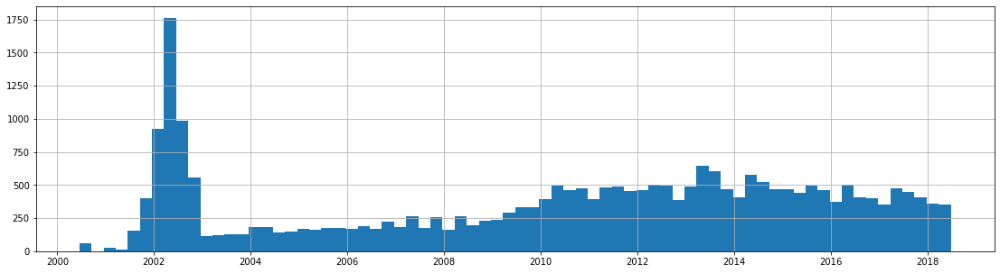

In [225]:
# Date of creation plot (bins = 72, which corresponds to 18 years split into quarters)
df_date = df[["License #", "ApproxCreationDate"]].drop_duplicates()
df_date["ApproxCreationDate"].hist(bins = 72, figsize = (19,5))

There is a peak in 2002 which probably corresponds to the period where they digitalised the businesse licenses management.

#### **1.1.3 Weekday**

Below, a visualisation representation of when the inspections are held during the week.

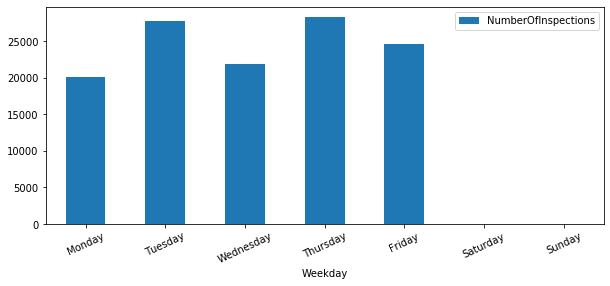

In [226]:
# Plot number of inspections per weekday
df_wd = df[["Inspection ID", "Weekday"]].groupby("Weekday", as_index = False).count()
df_wd["Weekday"] = pd.DataFrame(["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"], columns = ["Weekday"])
df_wd = df_wd.rename(columns = {"Inspection ID" : "NumberOfInspections"})
df_wd.plot(kind='bar', x = "Weekday", figsize = (10, 4), rot = 25)

It is not surprising to see that almost no inspections are held during the weekend (there are a few, those could have been mistyped). There seems to be more inspections on Tuesdays and Thursdays, while Monday is the 

### **1.2 Geographical data**

Chicago is a large city and was attributed a range of ZIPs. In the data set, it ranges from 60501 to 60827.

In [227]:
#Zip visualisation
zipList = list(df["Zip"].unique())
print(min(zipList))
print(max(zipList))

60501
60827


Below, this is a representation of where inspections are held.

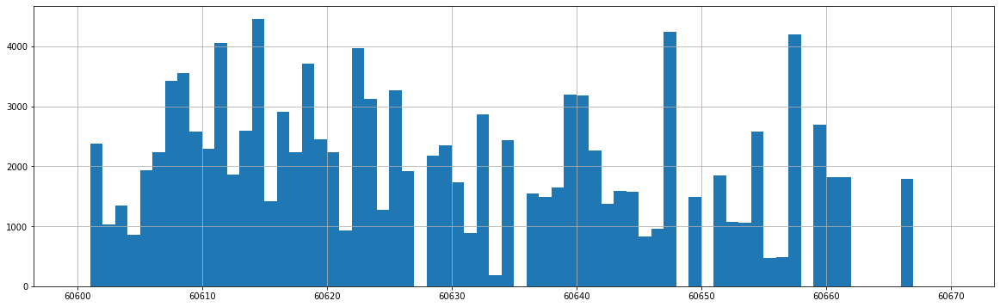

In [228]:
#Zip codes distribution (manually reduced the range to 60600-60670 for better visualisation)
df["Zip"].hist(range = (60600, 60670), figsize = (20,6), bins = 70)

Location could be useful in predicting the inspection outcome since a restaurant is implanted in a certain environment. There could be major differences between ZIP areas when it comes to median income, poverty, type of population, etc.


### **1.3 Facility type**

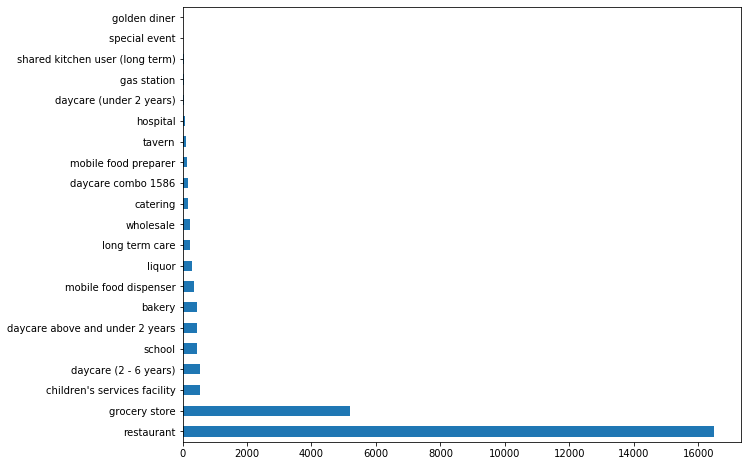

In [229]:
# Plot the facility types distribution (1 establishment counts only once)
df_ft = df[["License #", "Facility Type"]].drop_duplicates()
df_ft["Facility Type"].value_counts().plot(kind = "barh", figsize = (10, 8), rot = 0)

The most frequent class is "restaurant", followed by "grocery store". Those two categories dominate the others.

### **1.4 Inspection type**

#### **1.4.1 Distribution**

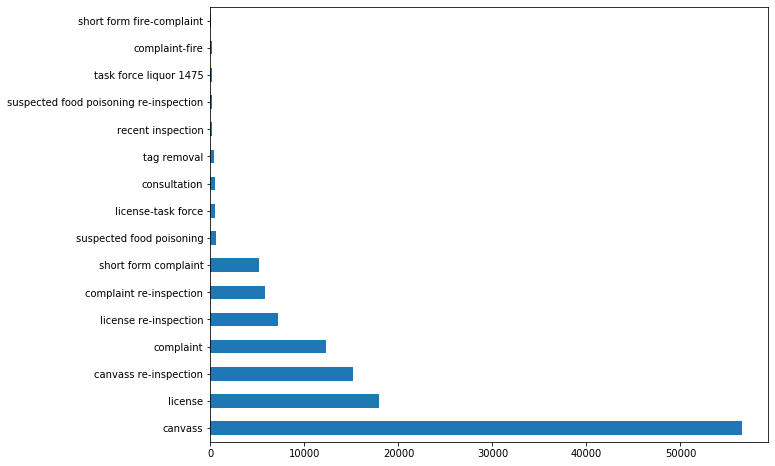

In [230]:
# Plot the inspection types distribution
df["Inspection Type"].value_counts().plot(kind = "barh", figsize = (10, 8), rot = 0)

The most frequent inspection type is "canvass", which are regular inspections, followed by "license", which is the first inspection required to obtain a license.

#### **1.4.2 Inspection outcome in relation to inspection type**

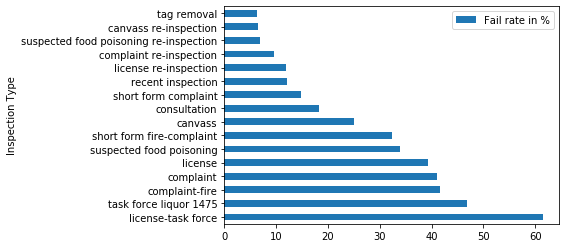

In [231]:
# Inspection type and inspection outcome relationship assessment
df_it = df[["Inspection Type", "Results", "Inspection ID"]]
df_it = df_it.rename(columns = {"Inspection ID" : "Count"})
df_gb = df_it.groupby(["Inspection Type", "Results"], as_index = False).count()

# Split into fail/pass
df_f = df_gb[df_gb["Results"] == "Fail"]
df_p = df_gb[df_gb["Results"] == "Pass"]

# Compute the fail rate per type of inspection
df_rate = df_f[["Inspection Type", "Count"]]
df_rate = df_rate.rename(columns = {"Count" : "Fail rate in %"})
df_rate["Fail rate in %"] = df_f.Count.values*100/(df_f.Count.values + df_p.Count.values)
df_rate = df_rate.sort_values(by = "Fail rate in %", ascending = False)
df_rate.plot(kind = "barh", x = "Inspection Type", y = "Fail rate in %")

The graph above shows the fail rate in % per inspection type. There is a interesting takeaway here : the fail rate for task-force inspection is above all the others.

Note : task-force refers to inspection that are specific to bars and taverns.

### **1.5 Risk types**

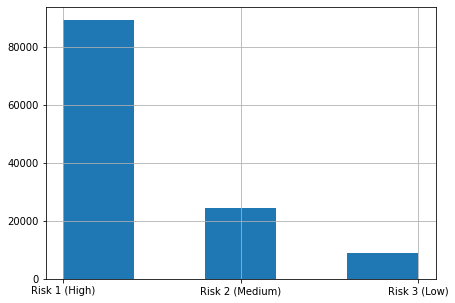

In [232]:
df["Risk"].hist(bins = 5, figsize = (7,5))

Most of the establishments are classified as "High" risk. This is related to their potential ability to affect public health.

### **1.6 Dependent variable**

#### **1.6.1 Skewness**

This graph indicates that the set is skewed. There are more "Pass" than "Fail".

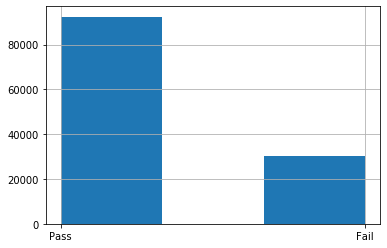

In [233]:
df["Results"].hist(bins = 3)

#### **1.6.2 Fail rate per year**

The data set is split into subsets based on the year and the inspection result. This is later used to compute the fail rate and create the maps in section 1.6.2.

In [0]:
#Split DF according to year and inspection result
from datetime import datetime

# Create list which contains the years (2010 to 2018) in a str format
years = []
for i in range(2010, 2019) :
  years.append(str(i))

# Create lists that will contain DFs
df_year = []
df_fail = []
df_pass = []

# For every year contained in the list above
for k in range(len(years)) :
  # Date masks
  date1 = datetime.strptime(years[k] + '-01-01', '%Y-%m-%d')
  date2 = datetime.strptime(years[k] + '-12-31', '%Y-%m-%d')

  # Appends the rows to df_year based on the current year defined by k
  df_year.append(df.loc[(df['Inspection Date']>=date1) & (df['Inspection Date']<=date2)])

  # Appends the rows for year k to df_dail and df_pass based on the inspection outcome
  df_fail.append(df_year[k][df_year[k]["Results"] == "Fail"])
  df_pass.append(df_year[k][df_year[k]["Results"] == "Pass"])

Below, the fail rate per year is computed and plotted. There is a drop in 2013 but it progressively returns to the initial level around 27%.

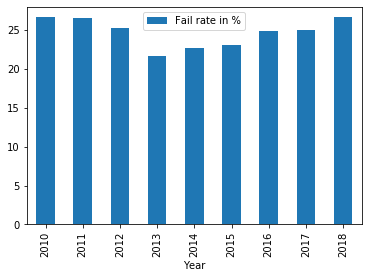

In [235]:
# Fail rate per year
fail_rate = {}
for k in range(len(years)) :
    fail_rate["201" + str(k)] = df_fail[k].shape[0]*100/(df_fail[k].shape[0] + df_pass[k].shape[0])

# Creat a DF to plot
df_fr = pd.DataFrame({"Year" : range(2010, 2019), "Fail rate in %" : list(fail_rate.values())})
df_fr.plot(kind = "bar", x = "Year", y = "Fail rate in %")

#### **1.6.2 Map visualisation**

In this section, the inspections results can be visualised on a map of Chicago. Failed inspections are plotted in red and passed ones in green.

In [236]:
# Folium install
!pip install folium

In [0]:
# Map the data
import folium

# Maps creation
map1 = folium.Map(location=[41.881944, -87.627778], tiles="stamentoner", zoom_start=11)

The value of "myYear" can be changed to visualise data for different years.

In [0]:
# Select a year to visualise : 0 to 8 which corresponds to 2010 to 2018
# Rerun this cell and the following ones to replot.
myYear = 5

In [0]:
# Add passed inspections for year k to the map
for j in range(len(df_pass[myYear])) :
  folium.Circle(
      location = [df_pass[myYear].iloc[j]["Latitude"], df_pass[myYear].iloc[j]["Longitude"]],
      radius = 5,
      color = "green",
      opacity = 0.35,
  ).add_to(map1)

# Add failed inspections for year k to the map
for j in range(len(df_fail[myYear])) :
  folium.Circle(
      location = [df_fail[myYear].iloc[j]["Latitude"], df_fail[myYear].iloc[j]["Longitude"]],
      radius = 5,
      color = "red",
      opacity = 0.35,
  ).add_to(map1)

In [240]:
# Show map - patience required
map1

In 2015, there is no clear pattern in the data. There are some small areas where it looks like the fail rate is low and some areas where it is high. The models will tell if location does impact the outcome of the inspection.